# **Malaria Detection**

##<b>Problem Definition</b>
**The context:** Why is this problem important to solve?
<br>
<br>
According to the World Health Organization (WHO), the estimated number of malaria deaths stood at 608,000 in 2022 and 610,000 in 2021. *(1)

Additionally, the WHO advises that "early diagnosis and treatment of malaria reduces disease, prevents deaths and contributes to reducing transmission... also recommends that all suspected cases of malaria be confirmed using parasite-based diagnostic testing (through either microscopy or a rapid diagnostic test)." *(2)

Finally, the WHO says Malaria is a serious infection and always requires treatment with medicine. *(3)

Given the information provided by the WHO, malaria is a very serious problem because it can be attributed to the deaths of over a million people in just 2021 and 2022; however, these deaths were not inevitable. As advised by the WHO, this problem can be ameliorated with early diagnosis and treatment of malaria to reduce deaths.

<br>

**The objectives:** What is the intended goal?
<br>
<br>
Given the WHO's advice to get early diagnosis, the goal of this model is to assist with parasite-based diagnostic testing through microscopy.
<br>
<br>

**The key questions:** What are the key questions that need to be answered?
<br>
<br>
On discussing microscopic diagnosis, the CDC says "malaria parasites can be identified by examining under the microscope a drop of the patient’s blood, spread out as a “blood smear” on a microscope slide." *(4)

The key question is whether or not a patient's blood can be accurately identified as infected or uninfected when visualized as a microscopic image of a blood smear.

<br>

**The problem formulation:** What is it that we are trying to solve using data science?
<br>
<br>
We need to create and train a computer vision model to perform microscopy analysis on images and be able to detect malaria. The model will need to review images of infected and uninfected blood cells to be able to distinguish between the two and properly diagnose a blood cell as infected or uninfected with accuracy.

<br>


`References:

1,2,3 -

https://www.who.int/news-room/fact-sheets/detail/malaria#:~:text=Disease%20burden&text=The%20estimated%20number%20of%20malaria,to%20610%20000%20in%202021

4 -

https://www.cdc.gov/malaria/diagnosis_treatment/diagnosis.html#:~:text=Malaria%20parasites%20can%20be%20identified,smear%E2%80%9D%20on%20a%20microscope%20slide.

<br>

## <b>Data Description </b>

There are a total of 24,958 train and 2,600 test images (colored) that we have taken from microscopic images. These images are of the following categories:<br>


**Parasitized:** The parasitized cells contain the Plasmodium parasite which causes malaria<br>
**Uninfected:** The uninfected cells are free of the Plasmodium parasites<br>


###<b> Mount the Drive

In [1]:
# Mounts Google drive and creates source to bring in data
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


### <b>Loading libraries</b>

In [2]:
# Importing libraries required to work with the data
import os  # Operating System module for file system operations
import cv2  # OpenCV library for image and video processing
from PIL import Image  # Python Imaging Library for image manipulation
import numpy as np  # NumPy for numerical computations
import pandas as pd  # Pandas for data manipulation and analysis
import matplotlib.pyplot as plt  # Matplotlib for creating visualizations
import seaborn as sns  # Seaborn for statistical graphics
import tensorflow as tf  # TensorFlow for machine learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical  # Keras utility for one-hot encoding
from tensorflow.keras.layers import LeakyReLU, BatchNormalization, Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split  # Scikit-learn for data splitting
from sklearn.preprocessing import MinMaxScaler  # Scikit-learn for feature scaling







# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Remove the limit from the number of displayed columns and rows.
pd.set_option("display.max_columns", None)  # Display all columns in Pandas DataFrames
pd.set_option("display.max_rows", 200)  # Display up to 200 rows in Pandas DataFrames


### <b>Let us load the data</b>

**Note:**
- You must download the dataset from the link provided on Olympus and upload the same to your Google Drive. Then unzip the folder.

In [3]:
# Importing the 'zipfile' module for working with zip files
import zipfile

# Assigned zip filepath to 'path' variable
path = '/content/drive/MyDrive/MIT Applied DS/Capstone Project/cell_images.zip'

# The data is provided as a zip file, so we need to extract the files from the zip file
with zipfile.ZipFile(path, 'r') as zip_ref:
    zip_ref.extractall()  # Extract all files from the zip file to the current directory


The extracted folder has different folders for train and test data will contain the different sizes of images for parasitized and uninfected cells within the respective folder name.

The size of all images must be the same and should be converted to 4D arrays so that they can be used as an input for the convolutional neural network. Also, we need to create the labels for both types of images to be able to train and test the model.

Let's do the same for the training data first and then we will use the same code for the test data as well.

In [4]:
# Storing the path of the extracted "train" folder
train_dir = '/content/cell_images/train'

# Size of image so that each image has the same size
SIZE = 64

# Empty list to store the training images after they are converted to NumPy arrays
train_images = []

# Empty list to store the training labels (0 - uninfected, 1 - parasitized)
train_labels = []

In [5]:
# We will run the same code for "parasitized" as well as "uninfected" folders within the "train" folder

# Iterating for the folders '/parasitized/' and '/uninfected/' in the "train" folder
for folder_name in ['/parasitized/', '/uninfected/']:

    # Path of the folder
    images_path = os.listdir(train_dir + folder_name)

    # Iterating for each image in the list of image names in the current folder
    for i, image_name in enumerate(images_path):

        try:

            # Opening each image using the path of that image
            image = Image.open(train_dir + folder_name + image_name)

            # Resizing each image to (64, 64)
            image = image.resize((SIZE, SIZE))

            # Converting images to arrays and appending that array to the empty list defined above
            train_images.append(np.array(image))

            # Creating labels for parasitized and uninfected images
            if folder_name == '/parasitized/':

                train_labels.append(1)  # Label 1 for parasitized images

            else:

                train_labels.append(0)  # Label 0 for uninfected images

        except Exception:

            pass  # Skip any images that can't be opened or processed

# Converting lists to arrays
train_images = np.array(train_images)

train_labels = np.array(train_labels)


In [6]:
# Storing the path of the extracted "test" folder
test_dir = '/content/cell_images/test'

# Size of image so that each image has the same size (it must be same as the train image size)
SIZE = 64

# Empty list to store the testing images after they are converted to NumPy arrays
test_images = []

# Empty list to store the testing labels (0 - uninfected, 1 - parasitized)
test_labels = []

In [7]:
# We will run the same code for "parasitized" as well as "uninfected" folders within the "test" folder

# Iterating for the folders '/parasitized/' and '/uninfected/' in the "test" folder
for folder_name in ['/parasitized/', '/uninfected/']:

    # Path of the folder
    images_path = os.listdir(test_dir + folder_name)

    # Iterating for each image in the list of image names in the current folder
    for i, image_name in enumerate(images_path):

        try:
            # Opening each image using the path of that image
            image = Image.open(test_dir + folder_name + image_name)

            # Resizing each image to (64, 64)
            image = image.resize((SIZE, SIZE))

            # Converting images to arrays and appending that array to the empty list defined above
            test_images.append(np.array(image))

            # Creating labels for parasitized and uninfected images
            if folder_name == '/parasitized/':

                test_labels.append(1)  # Label 1 for parasitized images

            else:

                test_labels.append(0)  # Label 0 for uninfected images

        except Exception:

            pass  # Skip any images that can't be opened or processed

# Converting lists to arrays
test_images = np.array(test_images)

test_labels = np.array(test_labels)

Adding brightness augmented images and zooming out

In [8]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming you have your original training images in the variable train_images
# and their corresponding labels in the variable train_labels

# Create an ImageDataGenerator with brightness_range=[0.8, 0.8] for the first set
brightness_low_datagen = ImageDataGenerator(brightness_range=[0.6, 0.6])

# Create an ImageDataGenerator with brightness_range=[1.2, 1.2] for the second set
brightness_high_datagen = ImageDataGenerator(brightness_range=[1.25, 1.25])

# Set the seed for reproducibility
np.random.seed(42)

# Create flow_from_directory generators
brightness_low_generator = brightness_low_datagen.flow(x=train_images, y=train_labels, batch_size=len(train_images), shuffle=False)
brightness_high_generator = brightness_high_datagen.flow(x=train_images, y=train_labels, batch_size=len(train_images), shuffle=False)

# Get augmented images and labels
brightness_low_images, brightness_low_labels = brightness_low_generator.next()
brightness_high_images, brightness_high_labels = brightness_high_generator.next()

# Concatenate the original and augmented images and labels
train_images = np.concatenate([train_images, brightness_low_images, brightness_high_images])
train_labels = np.concatenate([train_labels, brightness_low_labels, brightness_high_labels])



# Zoom
test_images_zoom_datagen = ImageDataGenerator(zoom_range=[1.20, 1.20])
train_images_zoom_datagen = ImageDataGenerator(zoom_range=[1.20, 1.20])

# Create flow_from_directory generators
test_images_zoom_generator = test_images_zoom_datagen.flow(x=test_images, y=test_labels, batch_size=len(test_images), shuffle=False)
train_images_zoom_generator = train_images_zoom_datagen.flow(x=train_images, y=train_labels, batch_size=len(train_images), shuffle=False)

# Get augmented images and labels
test_images, test_labels = test_images_zoom_generator.next()
train_images, train_labels = train_images_zoom_generator.next()




###<b> Check the shape of train and test images

In [9]:
print(f'Train images {train_images.shape}') # Returns shape of array
print(f'Test images {test_images.shape}\n') # Returns shape of array

Train images (74874, 64, 64, 3)
Test images (2600, 64, 64, 3)



####<b> Observations and insights:

Train Images:

The shape of the train_images array is (24958, 64, 64, 3).
This indicates there are 24958 images in the training set.
Each image has dimensions 64x64 pixels.
The last dimension, 3, suggests that the images are in color, as there are three color channels (red, green, and blue). If instead of a 3 there was a 4, that would indicate an additional channel for additonal color information like transparency.

Test Images:

The shape of the test_images array is (2600, 64, 64, 3).
There are 2,600 images in the test set.
Similar to the training set, each test image is also 64x64 pixels with three color channels.


###<b> Check the shape of train and test labels

In [10]:
print(f'Train labels {train_labels.shape}') # Returns shape of array
print(f'Test labels {test_labels.shape}\n') # Returns shape of array

Train labels (74874,)
Test labels (2600,)



####<b> Observations and insights:

Train Labels:

The shape of the train_labels array is (24958,) and corresponds to the training images.
The absence of a second dimension indicates that the labels are in a one-dimensional array.

Test Labels:

The shape of the test_labels array is (2600,) and corresponding to the test images.
Similar to the training set, the absence of a second dimension indicates one-dimensional labels.


### <b>Check the minimum and maximum range of pixel values for train and test images

In [11]:
# Check the minimum and maximum pixel values for training images
min_train = np.min(train_images)
max_train = np.max(train_images)

# Check the minimum and maximum pixel values for test images
min_test = np.min(test_images)
max_test = np.max(test_images)

# Print the results
print("Training Images - Min:", min_train, "Max:", max_train)
print("Test Images - Min:", min_test, "Max:", max_test)

Training Images - Min: 0.0 Max: 255.0
Test Images - Min: 0.0 Max: 255.0


####<b> Observations and insights:

Pixel Range:

The pixel values for both training and test images are in the range [0, 255].
The minimum pixel value is 0, indicating black.
The maximum pixel value is 255, indicating white.

Pixel Intensity:

The range of pixel values suggests the images are represented using 8 bits per channel.
In the context of RGB images, this means each color channel (red, green, blue) can take values from 0 to 255.

The pixel value range is suitable for typical image processing and computer vision tasks.

Normalization might be considered depending on the chosen  model.

Knowing the range of pixel values is required for preprocessing steps and choosing appropriate data augmentation techniques during model training.



###<b> Count the number of values in both uninfected and parasitized

In [12]:
# Print the counts
print("Training Label Counts:")
print(pd.Series(train_labels).value_counts())

print("\nTesting Label Counts:")
print(pd.Series(test_labels).value_counts())

Training Label Counts:
1    37746
0    37128
dtype: int64

Testing Label Counts:
1    1300
0    1300
dtype: int64


####<b> Observations and insights:

In the training set, there are 12,582 images labeled as parasitized (1) and 12,376 images labeled as uninfected (0); which means there is a slight imbalance.

The slight imbalance we see in the training data via the label count will be addressed.

In the testing set, there are 1,300 images for each class, maintaining a balanced distribution for testing.


###<b>Normalize the images

In [13]:
# Records prior ranges

X_train_prior = train_images
X_test_prior = test_images

print(f'Min value were: Train = {X_train_prior.min()}, Test = {X_test_prior.min()} ')
print(f'Max value were: Train = {X_train_prior.max()}, Test = {X_test_prior.max()} ')

# Normalize the pixel values from 0-255 to 0-1 and convert to float32

train_images = (train_images / 255).astype('float32')
test_images = (test_images / 255).astype('float32')

print(f'Min value: Train = {train_images.min()}, Test = {test_images.min()} ')
print(f'Max value: Train = {train_images.max()}, Test = {test_images.max()} ')

Min value were: Train = 0.0, Test = 0.0 
Max value were: Train = 255.0, Test = 255.0 
Min value: Train = 0.0, Test = 0.0 
Max value: Train = 1.0, Test = 1.0 


####<b> Observations and insights:

Prior to normalization, the pixel values range from 0 to 255 in both training and testing images.

After normalization, the pixel values are scaled to the range [0.0, 1.0].

Normalization of pixel values is performed to bring them into a standardized range.


### <b>Data Exploration</b>
Let's visualize the images from the train data

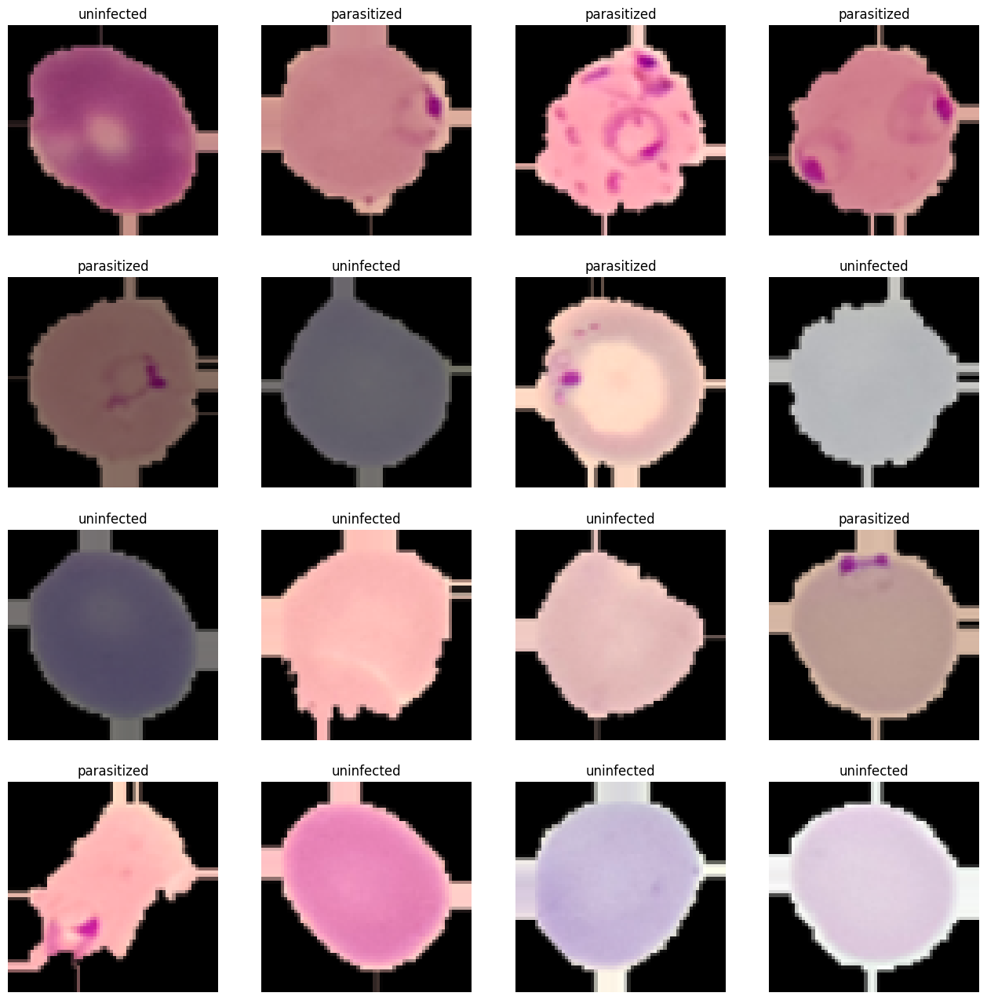

In [14]:
# This code will visualize both the parasitized and uninfected images
np.random.seed(42)  # Set the random seed for reproducibility

plt.figure(1, figsize=(16, 16))  # Create a figure with a specified size for the subplots

for n in range(1, 17):  # Loop to create 16 subplots in a 4x4 grid

    plt.subplot(4, 4, n)  # Set the subplot position in the 4x4 grid

    index = int(np.random.randint(0, train_images.shape[0], 1))  # Randomly select an index from the training images

    if train_labels[index] == 1:
        plt.title('parasitized')  # Set the title to 'parasitized' if the corresponding label is 1 (parasitized)
    else:
        plt.title('uninfected')  # Set the title to 'uninfected' if the corresponding label is 0 (uninfected)

    plt.imshow(train_images[index])  # Display the image corresponding to the selected index

    plt.axis('off')  # Turn off axis labels for better visualization


####<b> Observations and insights:

The cell above this is good for visual exploration of a small subset of the training data, previewing both classes (parasitized and uninfected) for assessment. It's a helpful step in understanding the dataset before proceeding with model development and training.

###<b> Visualize the images with subplot(6, 6) and figsize = (12, 12)

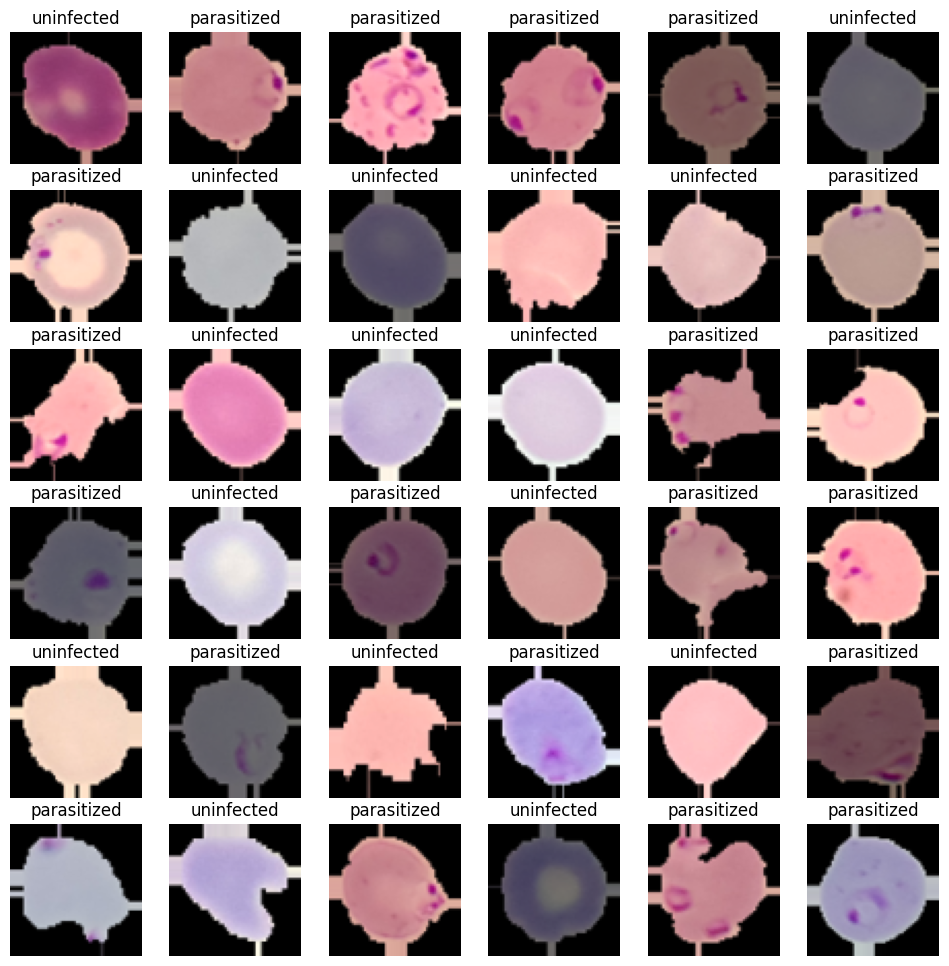

In [15]:
np.random.seed(42)  # Set the random seed for reproducibility

plt.figure(figsize=(12, 12))  # Create a figure with a specified size for the subplots

for n in range(1, 37):  # Loop to create 36 subplots in a 6x6 grid; adjust the range based on the desired number of images

    plt.subplot(6, 6, n)  # Set the subplot position in the 6x6 grid

    index = int(np.random.randint(0, train_images.shape[0], 1))  # Randomly select an index from the training images

    if train_labels[index] == 1:
        plt.title('parasitized')  # Set the title to 'Parasitized' if the corresponding label is 1 (parasitized)
    else:
        plt.title('uninfected')  # Set the title to 'Uninfected' if the corresponding label is 0 (uninfected)

    plt.imshow(train_images[index], cmap='gray')  # Display the image corresponding to the selected index in grayscale
    plt.axis('off')  # Turn off axis labels for better visualization

plt.show()  # Display the entire plot


####<b>Observations and insights:

By making the images smaller and outputting more images we can see more of the data without compromising quality of the output. This allows us to see more of our dataset. Some images are easy to differentiate between parasitized and uninfected, but some paraitized have little indication of infection.

###<b> Plotting the mean images for parasitized and uninfected

In [16]:
# Creating a function to find the mean image
def find_mean_img(full_mat, title):

    # Calculate the average
    mean_img = np.mean(full_mat, axis=0)[0]

    # Reshape it back to a matrix
    plt.imshow(mean_img)

    plt.title(f'Average {title}')

    plt.axis('off')  # Turn off axis labels for better visualization

    plt.show()  # Display the mean image

    return mean_img  # Return the calculated mean image

<b> Mean image for parasitized

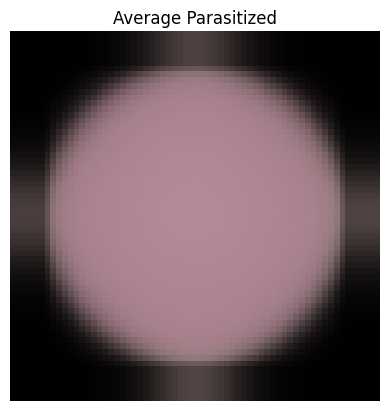

In [17]:
# If the label = 1 then the image is parasitized and if the label = 0 then the image is uninfected
parasitized_data = []  # Create a list to store the parasitized data

# Iterate through each image and label in the training set
for img, label in zip(train_images, train_labels):
    # Check if the label is 1 (parasitized)
    if label == 1:
        # Append the image to the parasitized_data list
        parasitized_data.append([img])

# Convert the parasitized_data list to a NumPy array
parasitized_data_array = np.array(parasitized_data)

# Find and visualize the mean image for parasitized
parasitized_mean = find_mean_img(parasitized_data_array, 'Parasitized')  # Find and display the mean image for parasitized


<b> Mean image for uninfected

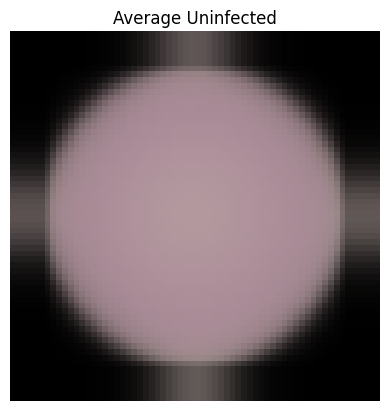

In [18]:
# If the label = 1 then the image is parasitized and if the label = 0 then the image is uninfected
uninfected_data = []  # Create a list to store the uninfected data

# Iterate through each image and label in the training set
for img, label in zip(train_images, train_labels):
    # Check if the label is 0 (uninfected)
    if label == 0:
        # Append the image to the uninfected_data list
        uninfected_data.append([img])

# Convert the uninfected_data list to a NumPy array
uninfected_data_array = np.array(uninfected_data)

# Find and visualize the mean image for uninfected
uninfected_mean = find_mean_img(uninfected_data_array, 'Uninfected')  # Find and display the mean image for uninfected


####<b> Observations and insights:

Mean images are very similar and could be hard to analyze for meaningful conclusions. We will have to take additional steps in working with the images to make our analysis more accurate.

### **Final Model**

The final model uses data augmentation with additional augments to make black edges transparent, and sampling to make sure our training data is completely balanced.

In [19]:
# Clearing backend
from tensorflow.keras import backend

backend.clear_session()

# Fixing the seed for random number generators
np.random.seed(42)

import random

random.seed(42)

tf.random.set_seed(42)


In [20]:
import numpy as np
from sklearn.utils import shuffle

# Set random seeds
np.random.seed(42)

# Separate images and labels for each class
parasitized_images = train_images[train_labels == 1]
parasitized_labels = train_labels[train_labels == 1]

uninfected_images = train_images[train_labels == 0]
uninfected_labels = train_labels[train_labels == 0]

# Determine the size of the smaller class (parasitized)
min_class_size = min(len(parasitized_images), len(uninfected_images))

# Undersample the larger class (parasitized)
undersampled_parasitized_images = parasitized_images[:min_class_size]
undersampled_parasitized_labels = parasitized_labels[:min_class_size]

# Combine the undersampled parasitized class with the original parasitized class
balanced_train_images = np.concatenate([uninfected_images, undersampled_parasitized_images])
balanced_train_labels = np.concatenate([uninfected_labels, undersampled_parasitized_labels])

# Shuffle the balanced dataset
balanced_train_images, balanced_train_labels = shuffle(balanced_train_images, balanced_train_labels, random_state=42)

# Now, balanced_train_images and balanced_train_labels contain an equal number of samples for each class


In [21]:
# Print the counts
print("Training Label Counts:")
print(pd.Series(balanced_train_labels).value_counts())

print("\nTesting Label Counts:")
print(pd.Series(test_labels).value_counts())

Training Label Counts:
0    37128
1    37128
dtype: int64

Testing Label Counts:
1    1300
0    1300
dtype: int64


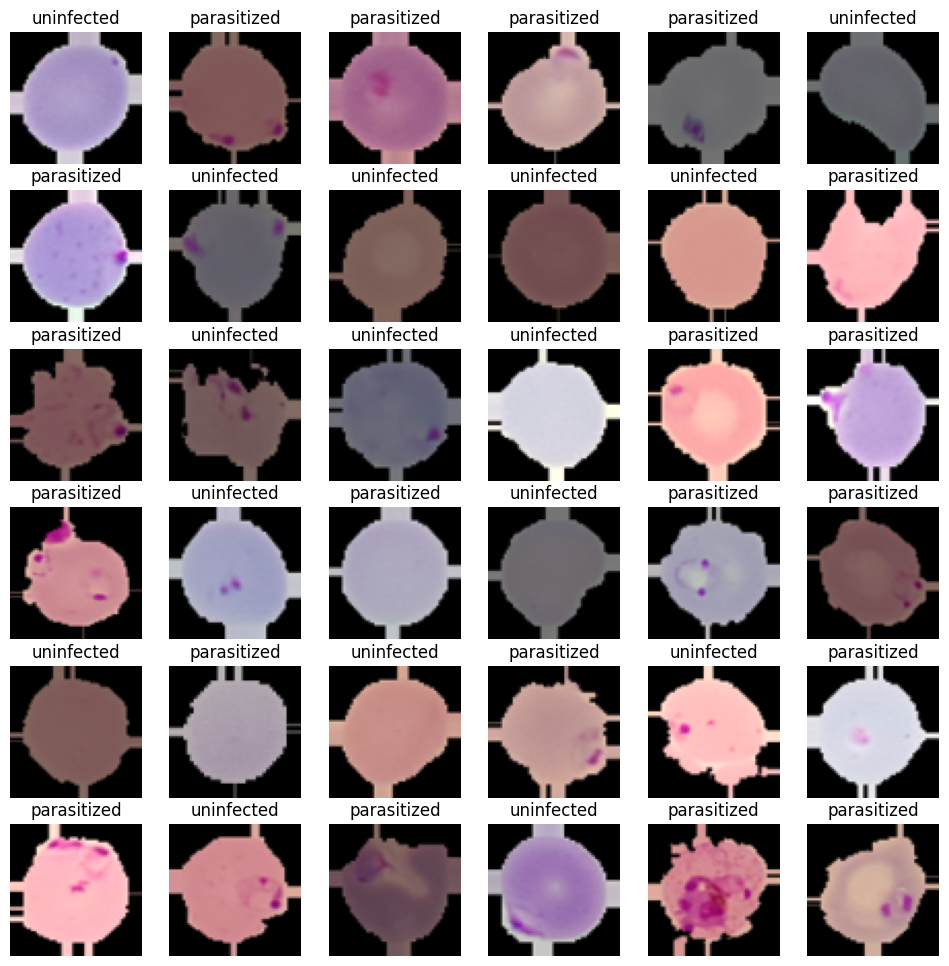

In [22]:
np.random.seed(42)  # Set the random seed for reproducibility

plt.figure(figsize=(12, 12))  # Create a figure with a specified size for the subplots

for n in range(1, 37):  # Loop to create 36 subplots in a 6x6 grid; adjust the range based on the desired number of images

    plt.subplot(6, 6, n)  # Set the subplot position in the 6x6 grid

    index = int(np.random.randint(0, balanced_train_images.shape[0], 1))  # Randomly select an index from the training images

    if train_labels[index] == 1:
        plt.title('parasitized')  # Set the title to 'Parasitized' if the corresponding label is 1 (parasitized)
    else:
        plt.title('uninfected')  # Set the title to 'Uninfected' if the corresponding label is 0 (uninfected)

    plt.imshow(balanced_train_images[index])  # Display the image corresponding to the selected index
    plt.axis('off')  # Turn off axis labels for better visualization

plt.show()  # Display the entire plot


In [23]:
# Creates one-hot encoded matrices

# Apply One-Hot Encoding to train labels
balanced_train_labels = to_categorical(balanced_train_labels, num_classes=2)

# Apply One-Hot Encoding to test labels
test_labels = to_categorical(test_labels, num_classes=2)

test_labels # Test labels



array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [24]:
test_labels # Test labels

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [25]:
print(f'Train labels {balanced_train_labels.shape}') # Returns shape of array
print(f'Test labels {test_labels.shape}') # Returns shape of array

Train labels (74256, 2)
Test labels (2600, 2)


In [26]:
# Import necessary libraries
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

# Function to make black color transparent in images
def make_black_transparent(image, threshold_value=50):
    # Convert the image to RGBA color space (adding an alpha channel)
    rgba_image = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)

    # Split the RGBA image into channels
    b, g, r, a = cv2.split(rgba_image)

    # Create a binary mask for black pixels
    black_mask = (b == 0) & (g == 0) & (r == 0)

    # Set the alpha channel to 0 (transparent) where the pixels are black
    a[black_mask] = 0

    # Merge the processed channels back into an RGBA image
    processed_rgba_image = cv2.merge([b, g, r, a])

    return processed_rgba_image

# Apply make_black_transparent to each image in the dataset
transparent_train_images = np.array([make_black_transparent(image) for image in balanced_train_images])

test_images = np.array([make_black_transparent(image) for image in test_images])

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(transparent_train_images, balanced_train_labels, test_size=0.1, random_state=42)

# Using ImageDataGenerator to generate images
train_datagen = ImageDataGenerator(
    horizontal_flip=True,  # Randomly flip images horizontally
    vertical_flip=True,  # Randomly flip images vertically
    shear_range=0.02,  # Shear transformation with a small intensity
    rotation_range=5,  # Rotation with a small angle
    zoom_range=[1.00, 1.10]  # Zoom out
)
val_datagen = ImageDataGenerator()

# Flowing training images using train_datagen generator
train_generator = train_datagen.flow(x=X_train, y=y_train, batch_size=16, shuffle=True)

# Flowing validation images using val_datagen generator
val_generator = val_datagen.flow(x=X_val, y=y_val, batch_size=64, shuffle=True)


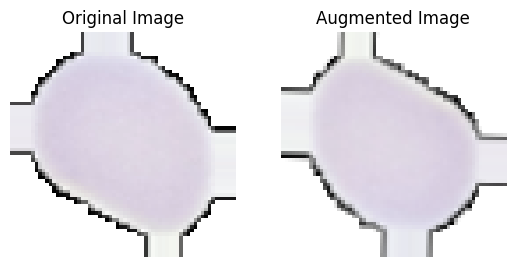

In [27]:
import matplotlib.pyplot as plt

# Visualize original and augmented images
original_image = transparent_train_images[0]  # Assuming there is at least one image in the dataset

# Display original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image)
plt.axis('off')

# Display augmented image
augmented_image = train_datagen.random_transform(original_image)
plt.subplot(1, 2, 2)
plt.title('Augmented Image')
plt.imshow(augmented_image)
plt.axis('off')

plt.show()


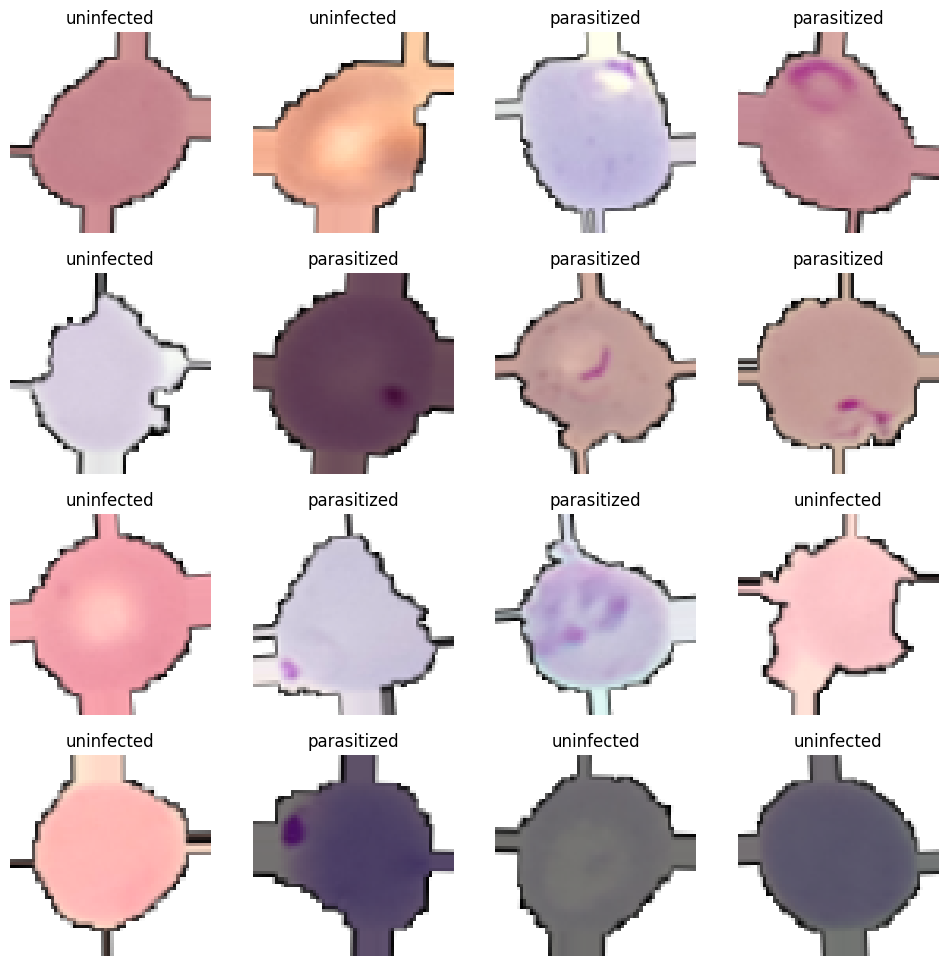

In [28]:

# Creating an iterable for images and labels from the training data
images, labels = next(train_generator)

# Plotting 16 images from the training data
fig, axes = plt.subplots(4, 4, figsize=(8, 8))

fig.set_size_inches(12, 12)

for (image, label, ax) in zip(images, labels, axes.flatten()):
    ax.imshow(image)

    # Check if label is one-hot encoded
    class_index = np.argmax(label)

    if class_index == 1:
        ax.set_title('parasitized')
    else:
        ax.set_title('uninfected')

    ax.axis('off')


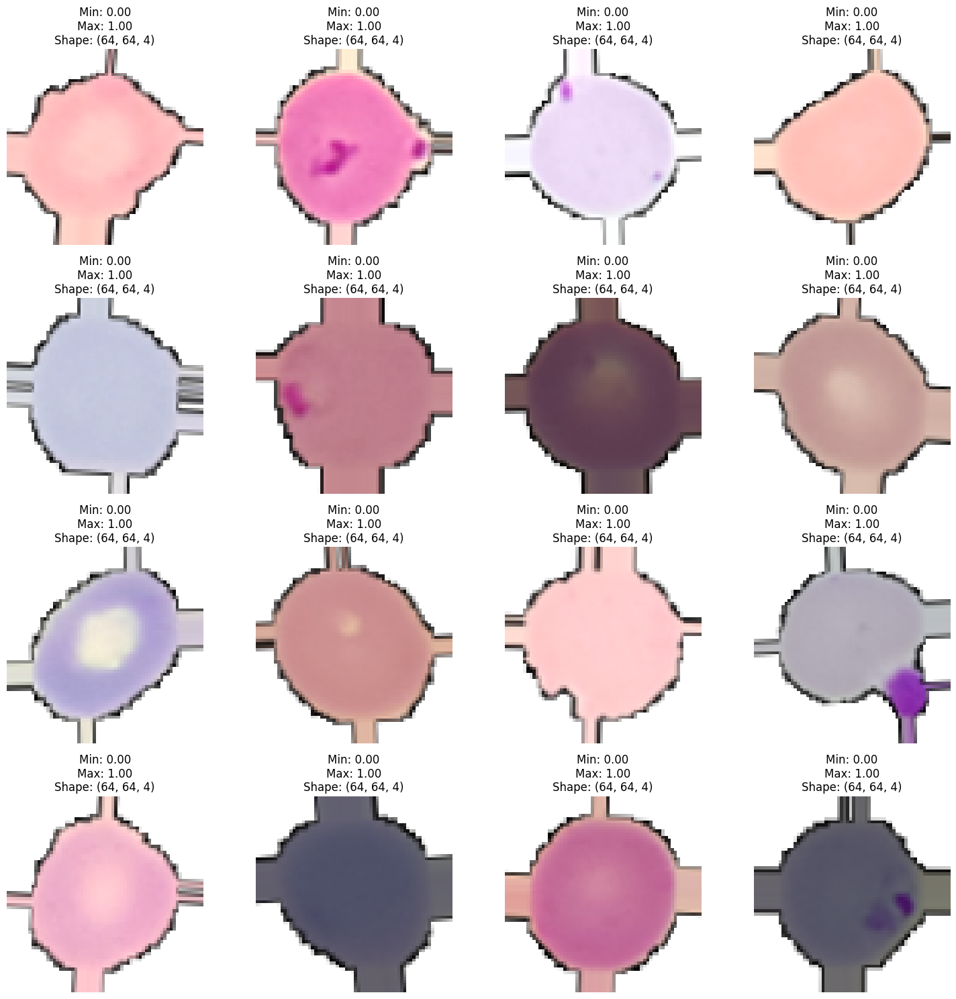

In [29]:
import matplotlib.pyplot as plt

# Number of images to visualize
num_images_to_visualize = 16

# Extract a batch of images and labels from the training generator
batch_images, batch_labels = next(train_generator)

# Visualize the first 30 images
plt.figure(figsize=(15, 15))
for i in range(num_images_to_visualize):
    plt.subplot(4, 4, i + 1)
    plt.imshow(batch_images[i])
    plt.title(f'Min: {np.min(batch_images[i]):.2f}\nMax: {np.max(batch_images[i]):.2f}\nShape: {batch_images[i].shape}')
    plt.axis('off')

plt.tight_layout()  # Ensure tight layout to prevent overlap
plt.show()

In [130]:

from tensorflow.keras import layers, optimizers
from tensorflow.keras.models import Sequential

model3 = Sequential()

# Convolutional layers with padding to maintain spatial dimensions
model3.add(Conv2D(filters=64, kernel_size=2, activation='relu', input_shape=(64, 64, 4), padding='same'))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Dropout(0.1))
model3.add(Conv2D(filters=64, kernel_size=2, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Dropout(0.1))
model3.add(Conv2D(filters=64, kernel_size=2, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Dropout(0.1))

model3.add(Conv2D(filters=64, kernel_size=5, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2, padding='same'))
model3.add(Dropout(0.1))
model3.add(Conv2D(filters=64, kernel_size=5, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2, padding='same'))
model3.add(Dropout(0.1))
model3.add(Conv2D(filters=64, kernel_size=5, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2, padding='same'))
model3.add(Dropout(0.1))

model3.add(Conv2D(filters=128, kernel_size=9, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2, padding='same'))  # Add 'same' padding to the MaxPooling2D layer
model3.add(Dropout(0.1))
model3.add(Conv2D(filters=128, kernel_size=9, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=2, padding='same'))  # Add 'same' padding to the MaxPooling2D layer
model3.add(Dropout(0.1))


# Flatten layer to transition from convolutional to dense layers
model3.add(Flatten())

# Output layer for final classification, assuming 2 classes for binary classification
model3.add(Dense(2, activation='softmax'))

# Compile the model with binary cross-entropy loss, Adam optimizer, and accuracy metric
adam = optimizers.Adam(learning_rate=0.0001)
model3.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# Build the model before calling summary to initialize the weights and biases
model3.build(input_shape=(64, 64, 4))

# Display a summary of the model architecture
model3.summary()


Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_188 (Conv2D)         (None, 64, 64, 64)        1088      
                                                                 
 max_pooling2d_188 (MaxPool  (None, 32, 32, 64)        0         
 ing2D)                                                          
                                                                 
 dropout_140 (Dropout)       (None, 32, 32, 64)        0         
                                                                 
 conv2d_189 (Conv2D)         (None, 32, 32, 64)        16448     
                                                                 
 max_pooling2d_189 (MaxPool  (None, 16, 16, 64)        0         
 ing2D)                                                          
                                                                 
 dropout_141 (Dropout)       (None, 16, 16, 64)      

In [131]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks = [EarlyStopping(monitor = 'val_loss', patience = 10), # Given the augments will try to be more intense with the training
             ModelCheckpoint('.mdl_wts.hdf5', monitor = 'val_loss', save_best_only = True)]

In [132]:
print(test_images.shape)

(2600, 64, 64, 4)


In [133]:

# Fit and train the model
history3 = model3.fit(train_generator,
                      validation_data=val_generator,
                      batch_size=16, callbacks=callbacks,
                      epochs=64, verbose=1)

Epoch 1/64
4177/4177 [==============================] - 98s 23ms/step - loss: 0.5860 - accuracy: 0.6448 - val_loss: 0.1268 - val_accuracy: 0.9569
Epoch 2/64
4177/4177 [==============================] - 94s 22ms/step - loss: 0.1149 - accuracy: 0.9599 - val_loss: 0.0743 - val_accuracy: 0.9763
Epoch 3/64
4177/4177 [==============================] - 94s 23ms/step - loss: 0.0790 - accuracy: 0.9744 - val_loss: 0.0594 - val_accuracy: 0.9791
Epoch 4/64
4177/4177 [==============================] - 94s 22ms/step - loss: 0.0663 - accuracy: 0.9785 - val_loss: 0.0542 - val_accuracy: 0.9809
Epoch 5/64
4177/4177 [==============================] - 94s 22ms/step - loss: 0.0601 - accuracy: 0.9798 - val_loss: 0.0545 - val_accuracy: 0.9803
Epoch 6/64
4177/4177 [==============================] - 94s 23ms/step - loss: 0.0578 - accuracy: 0.9803 - val_loss: 0.0532 - val_accuracy: 0.9798
Epoch 7/64
4177/4177 [==============================] - 94s 22ms/step - loss: 0.0561 - accuracy: 0.9804 - val_loss: 0.0509 -

In [134]:
# Evaluate the model on
accuracy = model3.evaluate(test_images, test_labels, verbose=1)
print('\nTest Accuracy:', accuracy[1])


82/82 [==============================] - 1s 5ms/step - loss: 0.0391 - accuracy: 0.9819

Test Accuracy: 0.9819231033325195


In [135]:
# Function to plot train and validation accuracy
def plot_accuracy(history3):
    N = len(history3.history["accuracy"])

    plt.figure(figsize=(7, 7))
    plt.plot(np.arange(0, N), history3.history["accuracy"], label="train_accuracy", ls='--')
    plt.plot(np.arange(0, N), history3.history["val_accuracy"], label="val_accuracy", ls='--')
    plt.title("Accuracy vs Epoch")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend(loc="upper left")

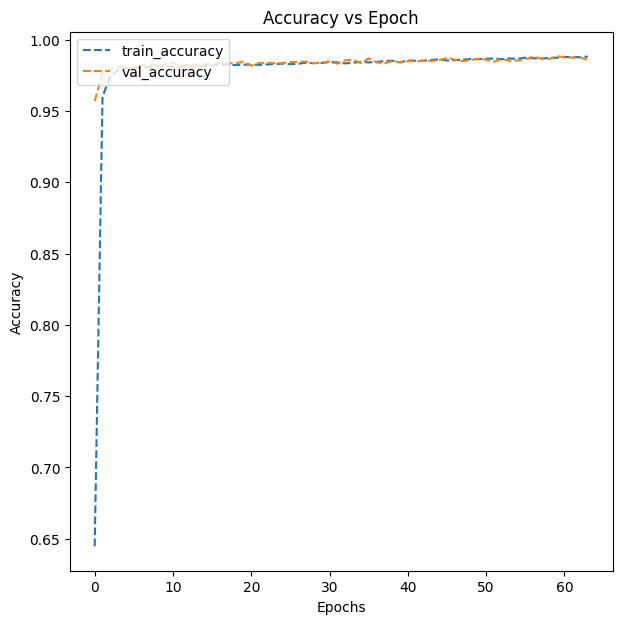

In [136]:
plot_accuracy(history3)

82/82 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      1300
           1       0.97      1.00      0.98      1300

    accuracy                           0.98      2600
   macro avg       0.98      0.98      0.98      2600
weighted avg       0.98      0.98      0.98      2600



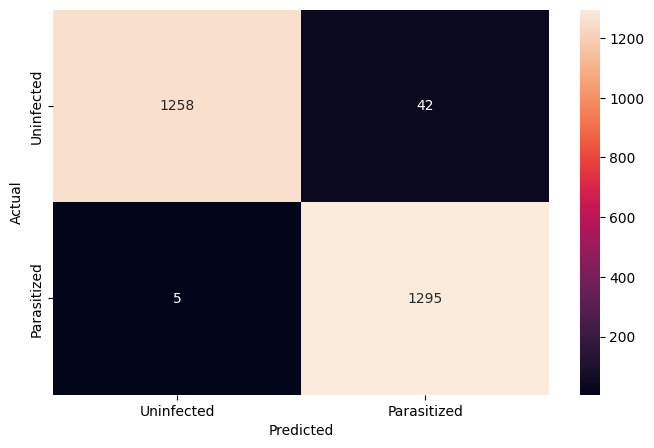

In [137]:
from sklearn.metrics import classification_report

from sklearn.metrics import confusion_matrix

pred = model3.predict(test_images)

pred = np.argmax(pred, axis = 1)

y_true = np.argmax(test_labels, axis = 1)

# Printing the classification report
print(classification_report(y_true, pred))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)

plt.figure(figsize = (8, 5))

sns.heatmap(cm, annot = True,  fmt = '.0f', xticklabels = ['Uninfected', 'Parasitized'], yticklabels = ['Uninfected', 'Parasitized'])

plt.ylabel('Actual')

plt.xlabel('Predicted')

plt.show()

In [138]:
y_pred = model3.predict(test_images)

82/82 [==============================] - 0s 4ms/step


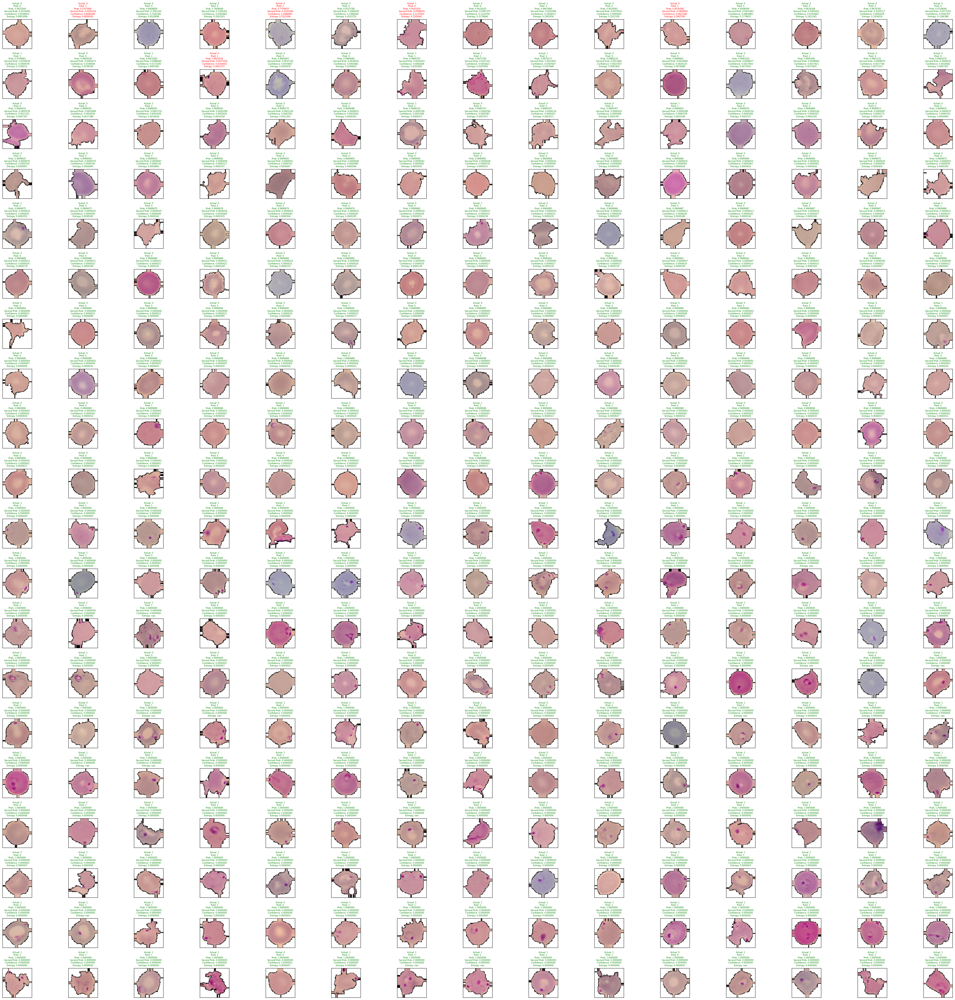

In [139]:
# Plot a sample of test images, their actual labels, predicted labels, probability of prediction for both classes, confidence and entropy
fig = plt.figure(figsize=(40, 40))
num_images_to_display = 300  # Output 300 images to review

# Number of rows and columns
num_rows = num_images_to_display // 15  # 15 images per row
num_cols = 15

# Create a list of tuples with image indices and probabilities
image_probabilities = [(idx, y_pred[idx][np.argmax(y_pred[idx])]) for idx in np.random.choice(test_images.shape[0], size=num_images_to_display, replace=False)]

# Sort the list based on probabilities
sorted_images = sorted(image_probabilities, key=lambda x: x[1])

for i, (idx, probability) in enumerate(sorted_images):
    ax = fig.add_subplot(num_rows, num_cols, i + 1, xticks=[], yticks=[])  # Adjust the subplot layout

    # Display the image
    ax.imshow(np.squeeze(test_images[idx]))

    # Get the predicted and true labels
    pred_idx = np.argmax(y_pred[idx])
    true_idx = np.argmax(test_labels[idx])

    # Calculate confidence
    confidence = 1 - (np.max(y_pred[idx]) - np.sort(y_pred[idx])[-2])  # 1 - (max probability - second max probability)

    # Get the second highest probability
    second_probability = np.sort(y_pred[idx])[-2]

    # Calculate Entropy
    entropy = -np.sum(y_pred[idx] * np.log(y_pred[idx]))

    # Set the title with the actual label, predicted label, probability, second probability, confidence, and entropy
    ax.set_title("Actual: {}\nPred: {}\nProb: {:.7f}\nSecond Prob: {:.7f}\nConfidence: {:.7f}\nEntropy: {:.7f}".format(
            true_idx, pred_idx, probability, second_probability, confidence, entropy),
            color=("green" if pred_idx == true_idx else "red"), fontsize=6)  # Adjust font size

plt.tight_layout()  # Ensure tight layout to prevent overlap
plt.show()


Number of Images Included in the Output: 300


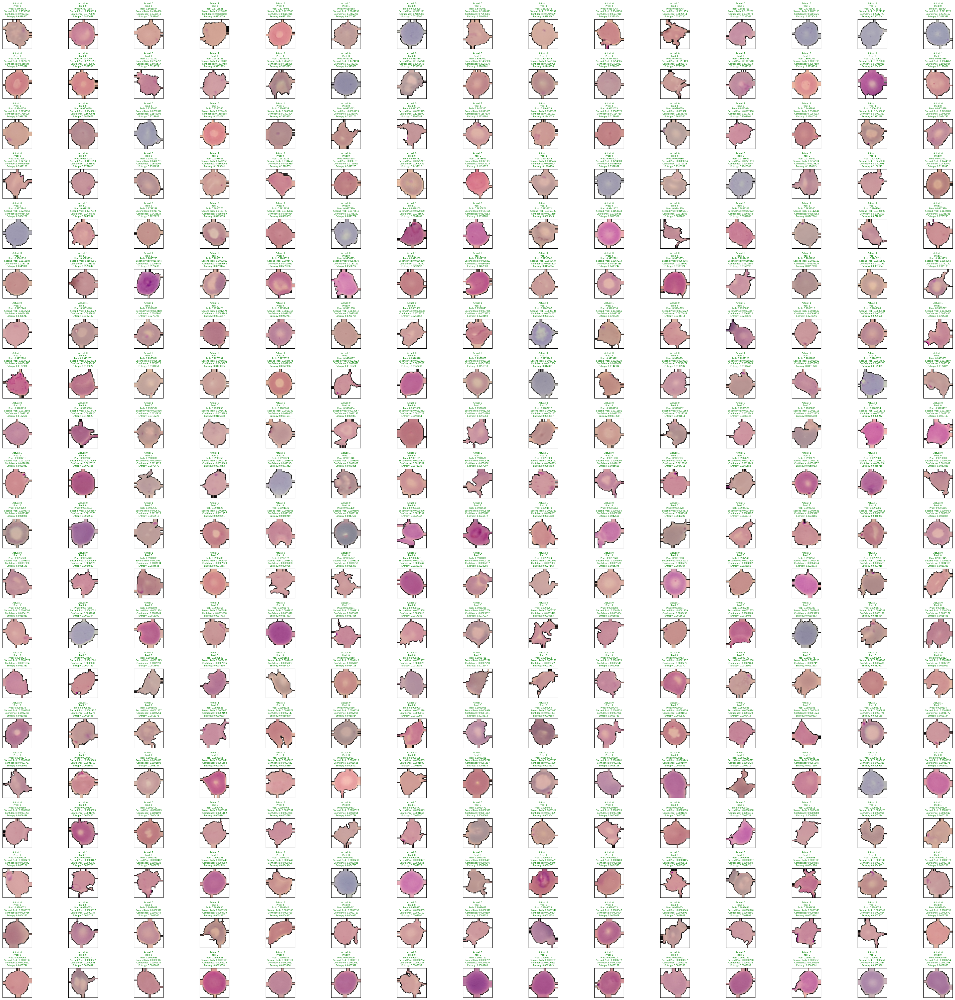

In [140]:
#Plot sample of images correct by lowest to highest probability

fig = plt.figure(figsize=(40, 40))
num_images_to_display = 300

# Create a list of tuples with image indices and probabilities
image_probabilities = [(idx, y_pred[idx][np.argmax(y_pred[idx])]) for idx in range(test_images.shape[0])]

# Sort the list based on probabilities
sorted_images = sorted(image_probabilities, key=lambda x: x[1])

# Calculate the number of rows and columns based on the desired layout
num_rows = num_images_to_display // 15
num_cols = 15

# Counter for displayed images
displayed_images = 0

# Iterate through sorted images
for i, (idx, probability) in enumerate(sorted_images):
    # Get the predicted and true labels
    pred_idx = np.argmax(y_pred[idx])
    true_idx = np.argmax(test_labels[idx])

    # Check if the prediction is incorrect (pred_idx is equal to true_idx)
    if pred_idx == true_idx:
        # Increment the counter
        displayed_images += 1

        # Calculate subplot position
        ax = fig.add_subplot(num_rows, num_cols, displayed_images, xticks=[], yticks=[])

        # Display the image
        ax.imshow(np.squeeze(test_images[idx]))

        # Calculate confidence
        confidence = 1 - (np.max(y_pred[idx]) - np.sort(y_pred[idx])[-2])  # 1 - (max probability - second max probability)

        # Get the second highest probability
        second_probability = np.sort(y_pred[idx])[-2]

        # Calculate Entropy
        entropy = -np.sum(y_pred[idx] * np.log(y_pred[idx]))

        # Set the title with the actual label, predicted label, probability, second probability, confidence, and entropy
        ax.set_title("Actual: {}\nPred: {}\nProb: {:.7f}\nSecond Prob: {:.7f}\nConfidence: {:.7f}\nEntropy: {:.7f}".format(
            true_idx, pred_idx, probability, second_probability, confidence, entropy),
            color=("green" if pred_idx == true_idx else "red"), fontsize=6)  # Adjust font size

        # Break the loop if the desired number of images is displayed
        if displayed_images == num_images_to_display:
            break

# Print the number of images included in the output
print("Number of Images Included in the Output:", displayed_images)

plt.tight_layout()  # Ensure tight layout to prevent overlap
plt.show()


Number of Images Included in the Output: 47


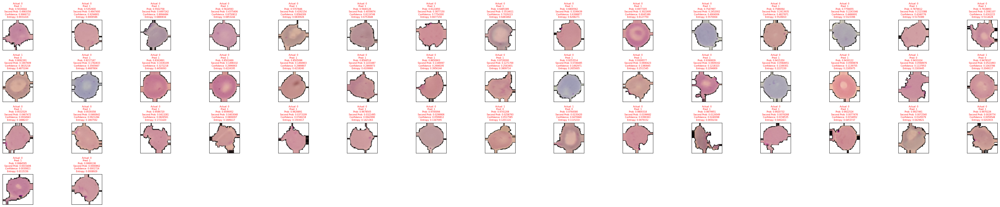

In [141]:
#Plot images not correct by lowest to highest probability

fig = plt.figure(figsize=(40, 40))  # Adjust the figure size
num_images_to_display = 300  # Number of images to display

# Create a list of tuples with image indices and probabilities
image_probabilities = [(idx, y_pred[idx][np.argmax(y_pred[idx])]) for idx in range(test_images.shape[0])]

# Sort the list based on probabilities
sorted_images = sorted(image_probabilities, key=lambda x: x[1])

# Calculate the number of rows and columns based on the desired layout
num_rows = num_images_to_display // 15  # 15 images per row
num_cols = 15

# Counter for displayed images
displayed_images = 0

# Iterate through sorted images
for i, (idx, probability) in enumerate(sorted_images):
    # Get the predicted and true labels
    pred_idx = np.argmax(y_pred[idx])
    true_idx = np.argmax(test_labels[idx])

    # Check if the prediction is incorrect (pred_idx is not equal to true_idx)
    if pred_idx != true_idx:
        # Increment the counter
        displayed_images += 1

        # Calculate subplot position
        ax = fig.add_subplot(num_rows, num_cols, displayed_images, xticks=[], yticks=[])  # Adjust the subplot layout

        # Display the image
        ax.imshow(np.squeeze(test_images[idx]))

        # Calculate confidence
        confidence = 1 - (np.max(y_pred[idx]) - np.sort(y_pred[idx])[-2])  # 1 - (max probability - second max probability)

        # Get the second highest probability
        second_probability = np.sort(y_pred[idx])[-2]

        # Calculate Entropy
        entropy = -np.sum(y_pred[idx] * np.log(y_pred[idx]))

        # Set the title with the actual label, predicted label, probability, second probability, confidence, and entropy
        ax.set_title("Actual: {}\nPred: {}\nProb: {:.7f}\nSecond Prob: {:.7f}\nConfidence: {:.7f}\nEntropy: {:.7f}".format(
            true_idx, pred_idx, probability, second_probability, confidence, entropy),
            color=("green" if pred_idx == true_idx else "red"), fontsize=6)  # Adjust font size
        # Break the loop if the desired number of images is displayed
        if displayed_images == num_images_to_display:
            break

# Print the number of images included in the output
print("Number of Images Included in the Output:", displayed_images)

plt.tight_layout()  # Ensure tight layout to prevent overlap
plt.show()


Number of Images Included in the Output: 226


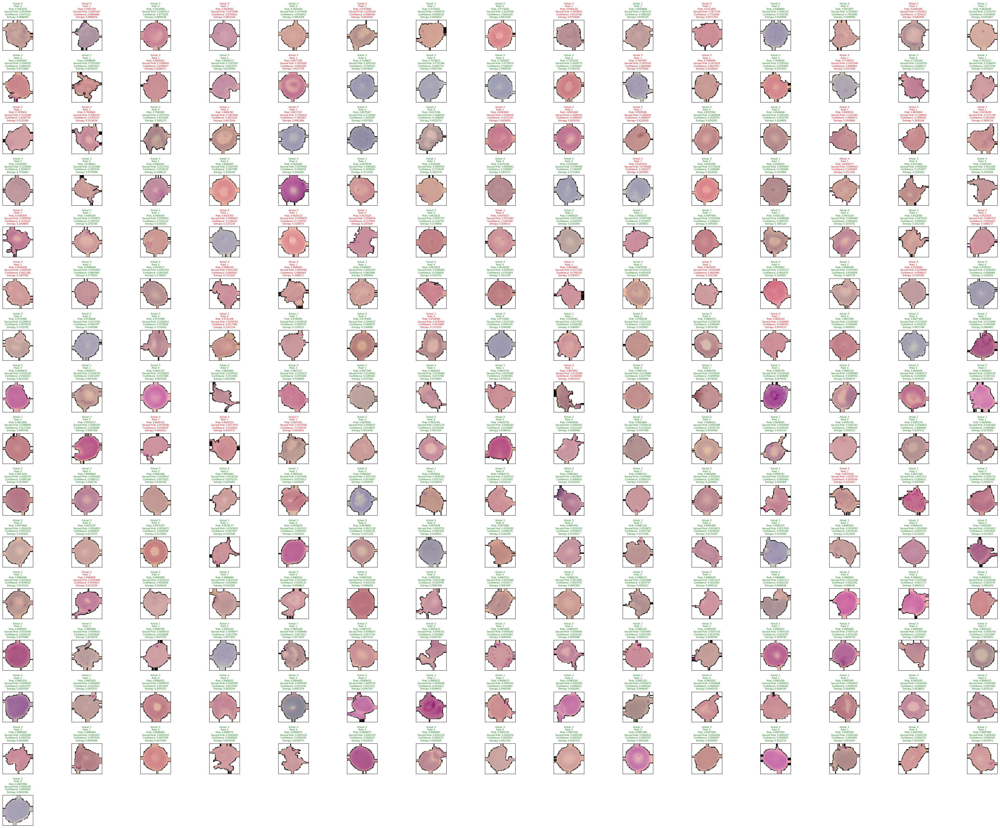

In [142]:
# Testing to isolate incorrect predictions using image scores
fig = plt.figure(figsize=(40, 40))  # Adjust the figure size
num_images_to_display = 300  # Number of images to display

# Create a list of tuples with image indices and probabilities
image_probabilities = [(idx, y_pred[idx][np.argmax(y_pred[idx])]) for idx in range(test_images.shape[0])]

# Sort the list based on probabilities
sorted_images = sorted(image_probabilities, key=lambda x: x[1])

# Calculate the number of rows and columns based on the desired layout
num_rows = num_images_to_display // 15  # 15 images per row
num_cols = 15

# Counter for displayed images
displayed_images = 0

# Iterate through sorted images
for i, (idx, probability) in enumerate(sorted_images):
    # Get the predicted and true labels
    pred_idx = np.argmax(y_pred[idx])
    true_idx = np.argmax(test_labels[idx])

    # Calculate confidence
    confidence = 1 - (np.max(y_pred[idx]) - np.sort(y_pred[idx])[-2])  # 1 - (max probability - second max probability)

    # Get the second highest probability
    second_probability = np.sort(y_pred[idx])[-2]

    # Calculate Entropy
    entropy = -np.sum(y_pred[idx] * np.log(y_pred[idx]))

    # Check if it meets the specified criteria
    if probability < 0.9998 and entropy > 0.001 and confidence < 0.915 and second_probability > .0002:
        # Increment the counter
        displayed_images += 1

        # Calculate subplot position
        ax = fig.add_subplot(num_rows, num_cols, displayed_images, xticks=[], yticks=[])  # Adjust the subplot layout

        # Display the image
        ax.imshow(np.squeeze(test_images[idx]))

        # Set the title with the actual label, predicted label, probability, second probability, confidence, and entropy
        ax.set_title("Actual: {}\nPred: {}\nProb: {:.7f}\nSecond Prob: {:.7f}\nConfidence: {:.7f}\nEntropy: {:.7f}".format(
            true_idx, pred_idx, probability, second_probability, confidence, entropy),
            color=("green" if pred_idx == true_idx else "red"), fontsize=6)  # Adjust font size

        # Break the loop if the desired number of images is displayed
        if displayed_images == num_images_to_display:
            break

# Print the number of images included in the output
print("Number of Images Included in the Output:", displayed_images)

plt.tight_layout()  # Ensure tight layout to prevent overlap
plt.show()


####<b> Observations and Conclusions drawn from the final model:




In [143]:
model_image_examples = "/content/drive/MyDrive/MIT Applied DS/Capstone Project/Pics for Model"

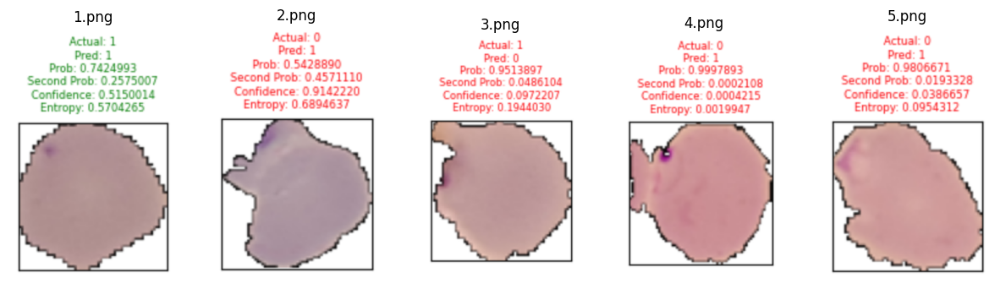

In [144]:
from matplotlib.image import imread
import os
import matplotlib.pyplot as plt

model_image_examples = "/content/drive/MyDrive/MIT Applied DS/Capstone Project/Pics for Model"

# Get a sorted list of image files in the folder
image_files = sorted([f for f in os.listdir(model_image_examples) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Set up the figure for displaying images
fig, axes = plt.subplots(1, len(image_files), figsize=(15, 15))

# Loop through the images and display them
for ax, image_file in zip(axes, image_files):
    # Read and display the image
    image_path = os.path.join(model_image_examples, image_file)
    image = imread(image_path)
    ax.imshow(image)

    # Set title with the image file name
    ax.set_title(image_file)

    # Hide the axes ticks
    ax.axis('off')

# Show the images
plt.show()


I selected the images above from the samples reviewed previously to explain the current paradox. Image #1 is infected. Image #2 is not infected but looks slightly more infected than #1. So, how to resolve this. To this untrained eye #2 looks more infected because the red/purple-ish spot is darker. Getting a subject matter experts opinion on this could add great value to ths endeaver.


Further, image #3 is infected and looks more similiar to images #2,4, and 5 than it does like #1 even though #1 is infected too and #2,4, and 5 aren't.

I considered isolating red in the images to help identify infected. But if we did that, the model would probably become more confident in incorrectly identifying images #2,4, and 5 as infected while potentially changing image #1 from being correctly classified as infected to not infected.

**Improvements that can be done:**<br>


*  Can the model performance be improved using other pre-trained models or different CNN architecture?
  
  Perhaps another pre-trained model or a different CNN architecture could work better. Setting up the model is a bit of an art that requires trial and error. Additional augmentation techniques such as color jittering or fancy PCA based augmentation might be able to make the model more dynamic/accurate. Experimentation can make the model better with time but a cost benefit analysis should be considered for the resources/time.

  A masking layer to make the black edges white (neutral) could work better than setting black to transparent. Further testing should be done.  

  Could there be uninfected blood cell images that are infected with some other condition that bias the model? Confirmation of the training blood could help.

  Consulting with a subject matter specialists could be very beneficial to better understand the patterns we need to look for and train the model on.

#### **Insights**

####**Refined insights**:
- What are the most meaningful insights from the data relevant to the problem?

  The data needs to be augmented so the model can make more generalizations and extrapolate what it learns to new images.

  Preparing the data is vital, steps must be taken to prepare the data as best as possible for the model's analysis.

  More is not always better. Too much complexity easily leads to ovefitting. The more robust the data the better the model. Augmentation can simulate this.

  Given the diversity of blood and pathogens that can infect it, it might not be possible to get 100% accuracy. In order to offset this, there should be a focus and development of methods/strategies to identify the small percerntage that is inaccurate and refer the respective patient to the proper medical service for further testing.

  I did some research on the process of identifying malaria through microscopy and learned that malaria tends to deform the shape of the blood cell. With that learned I decided to update my model to try to focus the analysis on learning the shapes of blood cells. I zoomed out of the images and increased the kernel size in the convolutional layers. Also, updated the settings of the image generator to focus on adapting images to increase image diversity without deforming any of the images.  

####**Proposal for the final solution design**:
- What model do you propose to be adopted? Why is this the best solution to adopt?

  The data augmented model has been the most efficient and accurate solution. It is the best solution because instead of needing more data to make the model more accurate the augmentation changes the data so the model can generalize more and extrapolate to new data.